# AJ_0069.3 - import SCENIC on 3 reprogramming scRNA-seq datasets, then split by batch, then integrate and visualize

## Table of content:  
#### 1) Import the object with integrated expression and export annotation and UMAP coordinates  
#### 2) 

In [2]:
suppressPackageStartupMessages({library(dplyr)
library(Seurat)
library(readr)
library(SingleCellExperiment, quietly = TRUE)
library(scater, quietly = TRUE)
library(tidyr)
library(purrr)
library(cowplot)
library(ggrepel)
library(viridis)
library(ggdendro)
library(gridExtra)
library(egg)
library(pheatmap)})

Warning message:
"package 'Seurat' was built under R version 3.6.2"Warning message:
"package 'matrixStats' was built under R version 3.6.2"

In [5]:
setwd("/staging/leuven/stg_00041/Adrian/TALON_JANISZEWSKI_XCR2/")

### Read Seurat object with integrated expression

In [6]:
integrated_expr <- readRDS("Schiebinger_integration/Schiebinger_smartseq_tenx_integrated.rds")

In [7]:
integrated_expr

Loading required package: Seurat
Warning message:
"package 'Seurat' was built under R version 3.6.2"Registered S3 method overwritten by 'R.oo':
  method        from       
  throw.default R.methodsS3
Registered S3 methods overwritten by 'ggplot2':
  method         from 
  [.quosures     rlang
  c.quosures     rlang
  print.quosures rlang


An object of class Seurat 
57406 features across 57536 samples within 2 assays 
Active assay: integrated (28703 features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [11]:
integrated_expr

An object of class Seurat 
57406 features across 57536 samples within 2 assays 
Active assay: integrated (28703 features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [12]:
int_expr_UMAP_coords <- integrated_expr@reductions$umap@cell.embeddings
write.csv(int_expr_UMAP_coords,"SCENIC/Schiebinger/int_expr_UMAP_coords.csv")

int_expr_UMAP_coords_clean <- int_expr_UMAP_coords
rownames(int_expr_UMAP_coords_clean) <- gsub('-', '.', rownames(int_expr_UMAP_coords_clean))
write.csv(int_expr_UMAP_coords_clean,"SCENIC/Schiebinger/int_expr_UMAP_coords_clean.csv")

In [13]:
int_expr_meta_data <- as.data.frame(integrated_expr@meta.data)
write.csv(int_expr_meta_data,"SCENIC/Schiebinger/int_expr_meta_data.csv")

In [22]:
annotation_loom <- data.frame(time_point = int_expr_meta_data$time_point,row.names = rownames(int_expr_meta_data))
write.csv(annotation_loom, "SCENIC/Schiebinger/annotation_loom.csv")

In [23]:
table(int_expr_meta_data$project)


        10X Schiebinger    smartseq 
       6969       50000         567 

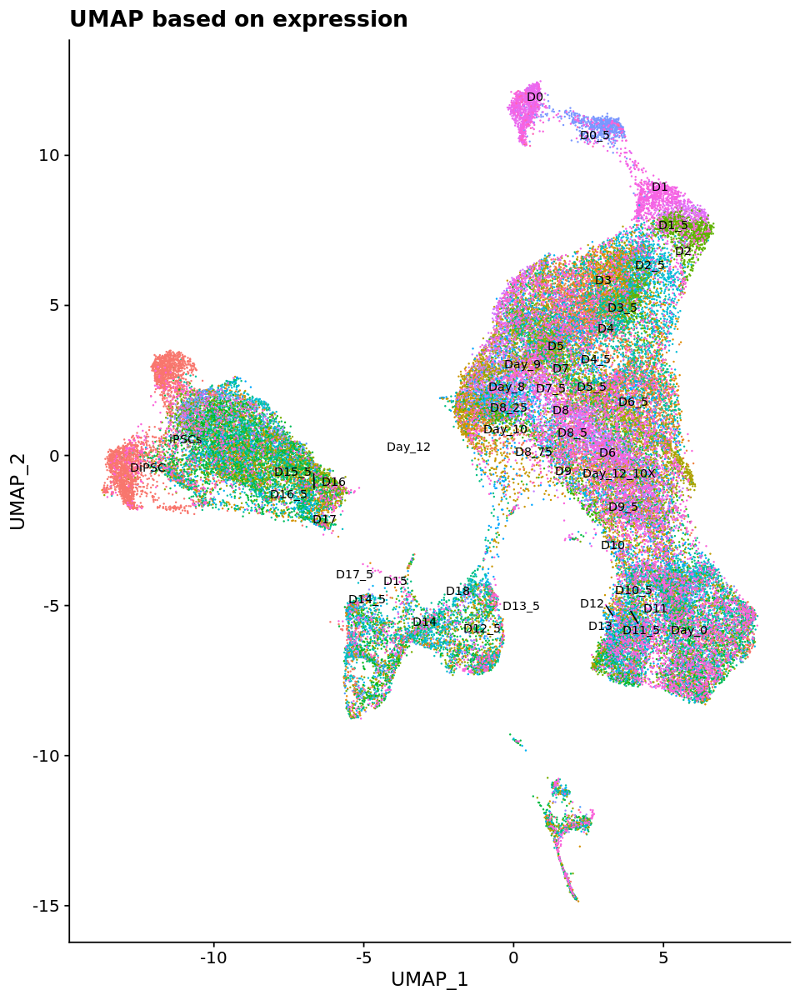

In [24]:
DimPlot(integrated_expr, reduction = "umap",repel = T,label.size = 3, label = TRUE, pt.size = 0.05) + NoLegend() +ggtitle("UMAP based on expression")

### Importing the pySCENIC output, reduced dims from seurat and clusters annotation

Import pySCENIC output

In [25]:
auc_mtx <- read.csv("SCENIC/Schiebinger/auc_reprogramming.big_embryo_norm_692.csv")

In [26]:
colnames(auc_mtx)[2:length(colnames(auc_mtx))] <- gsub('.{0,3}$', '', colnames(auc_mtx)[2:length(colnames(auc_mtx))])

In [27]:
head(auc_mtx)

Cell,X2410141K09Rik,X2610044O15Rik8,AW146154,Ahr,Alx1,Alx3,Alx4,Arnt,Arx,...,Zfp933,Zfp938,Zfp950,Zfpm1,Zfx,Zfy1,Zic1,Zic2,Zmiz1,Zxdb
Schiebinger_DiPSC_2i_C1_CCATGTCAGACTAGGC.1,0,0.00000000,0,0.00000000,0.001712439,0,0,0.0116700660,0.000000000,...,0.000000000,0,0.010138273,0,0.000000000,0,0.009170793,0,0.01940898,0.00000000
Schiebinger_D8.5_2i_C1_CGGACTGGTAATTGGA.1,0,0.00000000,0,0.00000000,0.000000000,0,0,0.0000394259,0.000000000,...,0.006979798,0,0.003571194,0,0.000000000,0,0.005779242,0,0.01842719,0.01810999
Schiebinger_D4_Dox_C1_AGAGCTTCAGGAATGC.1,0,0.00000000,0,0.00000000,0.000000000,0,0,0.0060112755,0.000000000,...,0.010440755,0,0.001857367,0,0.000000000,0,0.010296870,0,0.02055085,0.00000000
Schiebinger_D12.5_2i_C1_GTCTTCGGTGACGGTA.1,0,0.03880028,0,0.00000000,0.000000000,0,0,0.0099816025,0.002118693,...,0.007047817,0,0.002931534,0,0.000000000,0,0.012531022,0,0.03426327,0.05924013
Schiebinger_D3_Dox_C2_TCTGGAAAGCTGCGAA.1,0,0.00000000,0,0.00000000,0.000000000,0,0,0.0189227620,0.000000000,...,0.012213562,0,0.004763646,0,0.004773759,0,0.007217136,0,0.03313888,0.00000000
Schiebinger_D18_2i_C2_TGCACCTTCTTCTGGC.1,0,0.00000000,0,0.01351355,0.007966534,0,0,0.0126463448,0.000954697,...,0.000000000,0,0.008906088,0,0.000000000,0,0.045499259,0,0.05192971,0.05231115


In [28]:
auc_mtx_matrix <- t(as.matrix(data.frame(auc_mtx[,-1], row.names = auc_mtx$Cell)))

In [29]:
# Match cell names because SCENIC replaces dashes with dots
rownames(int_expr_meta_data) <- gsub('-', '.', rownames(int_expr_meta_data))

In [30]:
# remove X at the beginning of auc mtx colnames from 10X data
ind <- which(rownames(int_expr_meta_data) != colnames(auc_mtx_matrix))
new_cols <- gsub('^.','', colnames(auc_mtx_matrix)[ind])
colnames(auc_mtx_matrix)[ind] <- new_cols

In [31]:
write.csv(auc_mtx_matrix, "SCENIC/Schiebinger/auc_mtx_matrix.csv")

In [32]:
table(colnames(auc_mtx_matrix) == rownames(int_expr_meta_data))


 TRUE 
57536 

### Import results to seurat and do dendrogram 

In [33]:
seurat_scenic <- CreateSeuratObject(counts = auc_mtx_matrix, meta.data = int_expr_meta_data, min.cells = 0, min.features = 0)

In [34]:
seurat_scenic

An object of class Seurat 
499 features across 57536 samples within 1 assay 
Active assay: RNA (499 features)

In [35]:
seurat_scenic <- FindVariableFeatures(seurat_scenic, selection.method = "vst", nfeatures = 499)

In [36]:
all.genes <- rownames(seurat_scenic)

In [37]:
seurat_scenic <- ScaleData(seurat_scenic, features = all.genes)

Centering and scaling data matrix


In [38]:
seurat_scenic <- RunPCA(seurat_scenic, features = VariableFeatures(object = seurat_scenic))

PC_ 1 
Positive:  Ezh2, Polr3g, Mybl2, E2f4, Nelfe, Nfyc, Brca1, Gtf2f1, Pole3, Cebpz 
	   Myc, Hdac1, Taf7, Sox2, Max, Hdac2, Gabpb1, Tbx3, Zfp932, Nanog 
	   Esx1, Pole4, Bclaf1, Klf5, Nfyb, Esrrb, Ubtf, Sox15, Atf4, Nrf1 
Negative:  Zmiz1, Zeb1, Egr1, Fosl2, Sox4, Hic1, Tcf4, Setbp1, Creb3l2, Foxc1 
	   Thra, Junb, Klf7, Zbtb7a, Tbx15, Cux1, Zfp467, Fos, Creb3l1, Elk3 
	   Mylk, Mxd4, Jun, Foxp1, Hoxc8, Twist1, Nfkb1, Vezf1, Maf, Stat1 
PC_ 2 
Positive:  Six1, Hoxa7, Hoxc6, Klf7, Twist1, Nfe2l2, Hoxc8, Hoxa9, Dbp, Hes6 
	   Hoxa10, Erg, Runx1, Hoxd11, Junb, Mylk, Hoxd12, Smarcb1, Creb3, Hoxc10 
	   Mef2c, Id1, Nfatc4, Thra, Maf, Fosl1, Cebpb, Elk3, Etv1, Hif1a 
Negative:  Rad21, Kdm5b, Hcfc1, Kdm5a, Rest, Smarca4, E2f8, Ctcf, Srebf2, Sp1 
	   Sin3a, Etv3, Creb1, Klf16, Myef2, Srebf1, Phf8, Sp3, Atf2, Bclaf1 
	   E2f7, Gtf3c2, Ubtf, Klf5, Etv6, Taf7, Maz, Yy1, Zfp148, Elf1 
PC_ 3 
Positive:  E2f1, Phox2b, Ctcf, Bcl11a, Sox11, Hoxd12, Hoxd11, Etv1, Dbp, Nfatc4 
	   Pou3f2, Maz, Hoxa10

In [39]:
seurat_scenic

An object of class Seurat 
499 features across 57536 samples within 1 assay 
Active assay: RNA (499 features)
 1 dimensional reduction calculated: pca

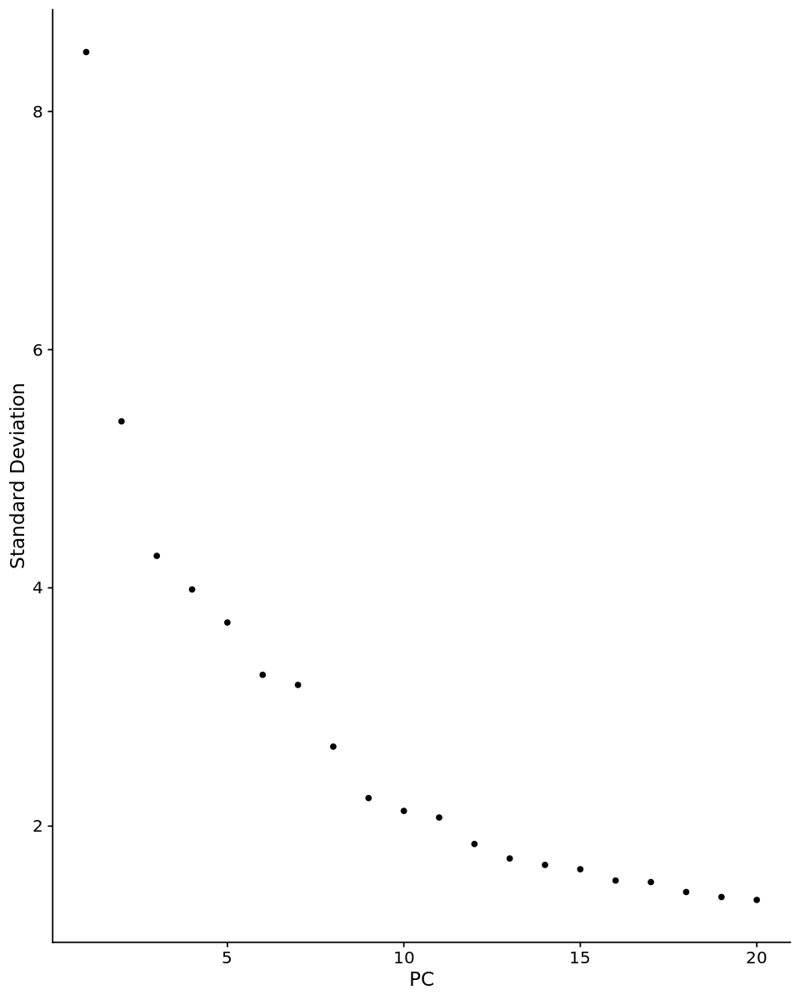

In [40]:
ElbowPlot(seurat_scenic)

In [41]:
seurat_scenic <- RunUMAP(seurat_scenic, dims = 1:20, seed = 1234)

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"16:01:08 UMAP embedding parameters a = 0.9922 b = 1.112
16:01:09 Read 57536 rows and found 20 numeric columns
16:01:09 Using Annoy for neighbor search, n_neighbors = 30
16:01:09 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
16:01:16 Writing NN index file to temp file /tmp/RtmpJ4yvzO/file58365005d0be
16:01:16 Searching Annoy index using 1 thread, search_k = 3000
16:01:38 Annoy recall = 100%
16:01:38 Commencing smooth kNN distance calibration using 1 thread
16:01:41 Initializing from normalized Laplacian + noise
16:01:45 Commencing optimizati

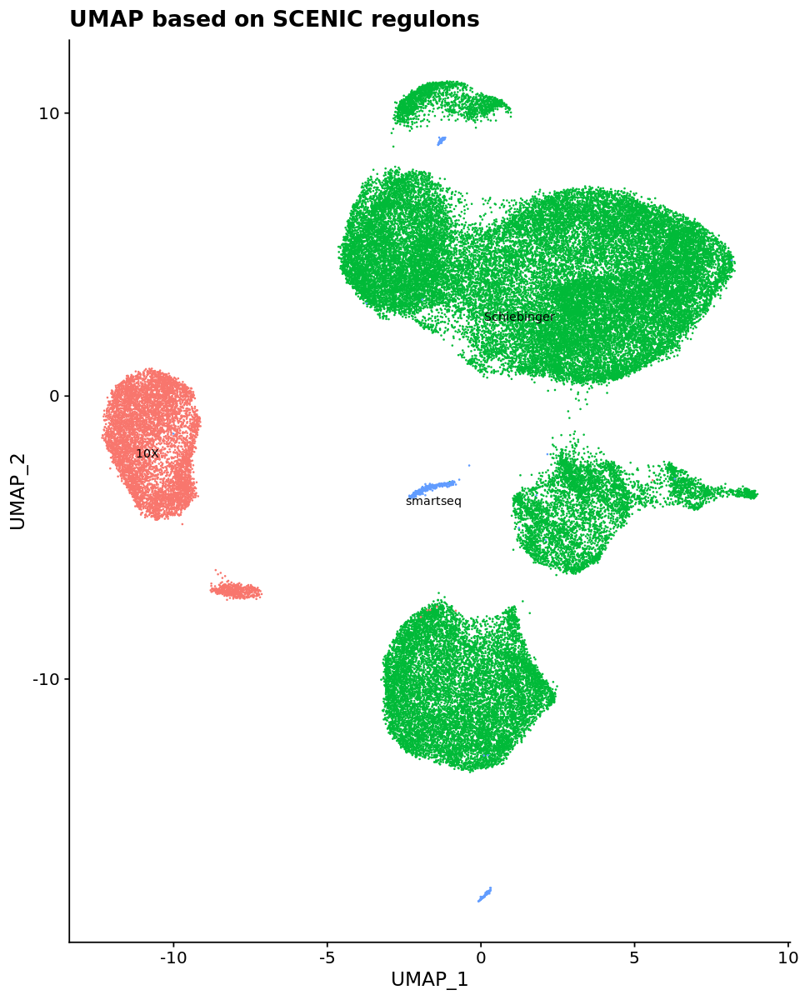

In [42]:
DimPlot(seurat_scenic, group.by = "project", reduction = "umap",repel = T,label.size = 3, label = TRUE, pt.size = 0.1) + NoLegend() +ggtitle("UMAP based on SCENIC regulons")

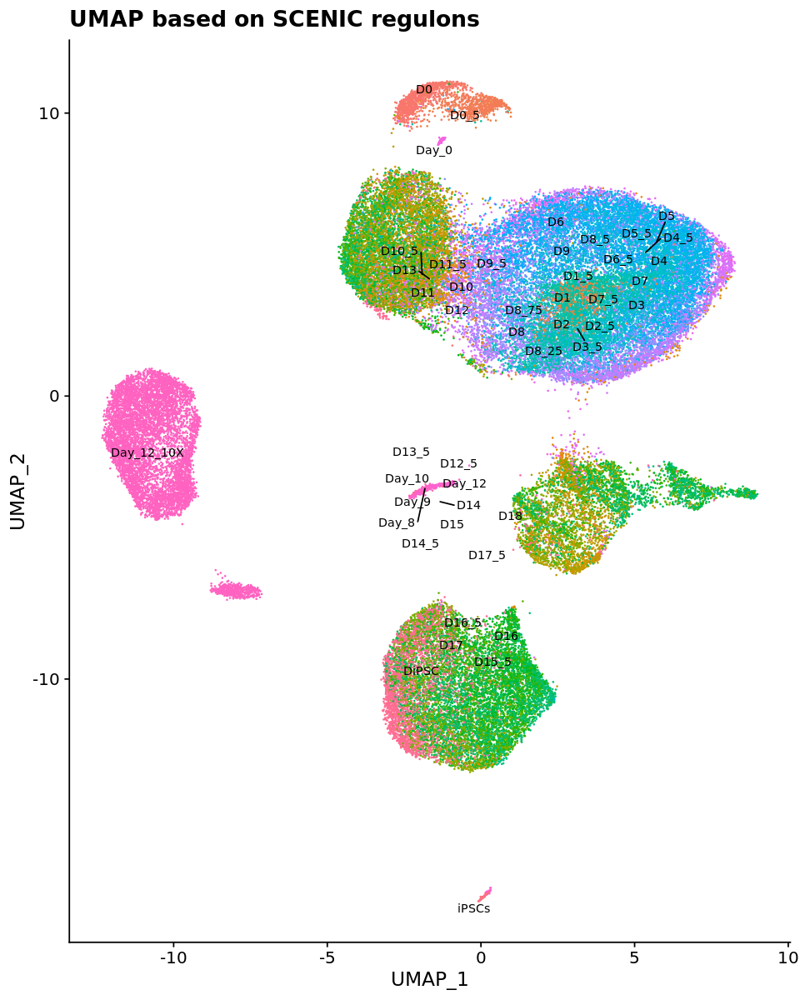

In [43]:
DimPlot(seurat_scenic,  reduction = "umap",group.by="time_point",repel = T,label.size = 3, label = TRUE, pt.size = 0.1) + NoLegend() +ggtitle("UMAP based on SCENIC regulons")

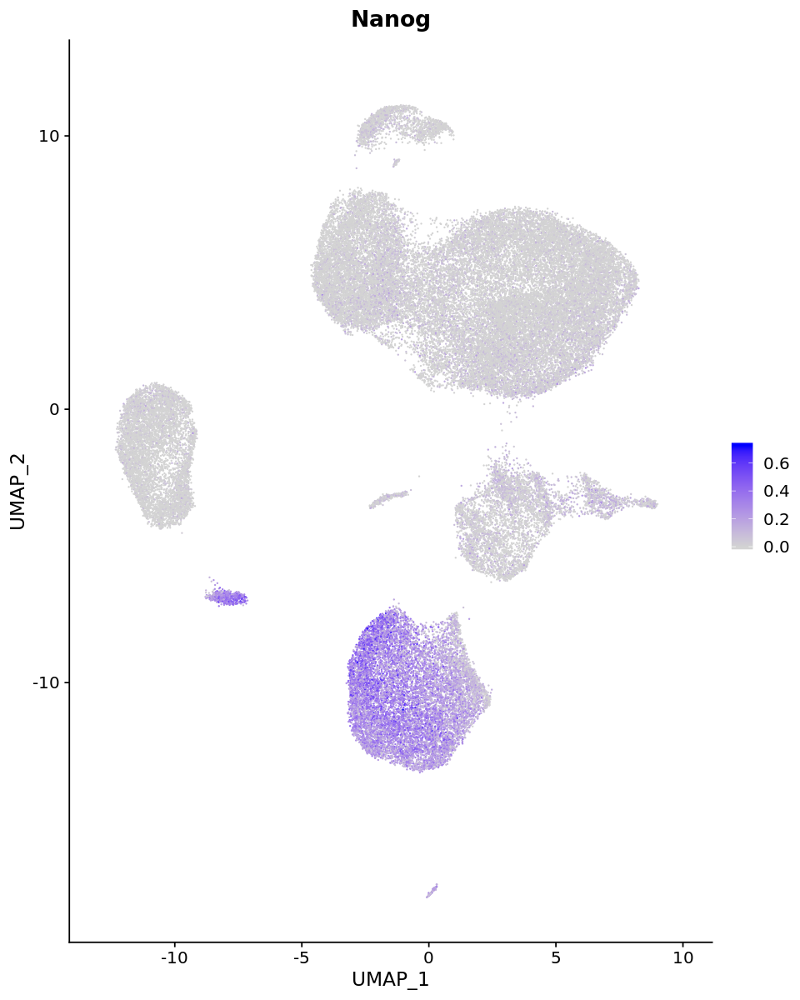

In [44]:
FeaturePlot(seurat_scenic, features = c('Nanog'), reduction = "umap")

In [15]:
head(int_expr_UMAP_coords)

,UMAP_1,UMAP_2
Schiebinger_DiPSC_2i_C1_CCATGTCAGACTAGGC-1,-11.980671,3.347528
Schiebinger_D8.5_2i_C1_CGGACTGGTAATTGGA-1,-1.259542,2.782032
Schiebinger_D4_Dox_C1_AGAGCTTCAGGAATGC-1,2.530941,5.899474
Schiebinger_D12.5_2i_C1_GTCTTCGGTGACGGTA-1,-5.359768,-4.944048
Schiebinger_D3_Dox_C2_TCTGGAAAGCTGCGAA-1,3.634967,6.936995
Schiebinger_D18_2i_C2_TGCACCTTCTTCTGGC-1,4.354001,-7.295649


In [16]:
rownames(int_expr_UMAP_coords) <- gsub('-', '.', rownames(int_expr_UMAP_coords))

In [17]:
# Add UMAP coords for expr based umap
seurat_scenic[["umap_rna"]] <- CreateDimReducObject(embeddings = int_expr_UMAP_coords, key = "umap_rna_", assay = DefaultAssay(seurat_scenic))

ERROR: Error in DefaultAssay(seurat_scenic): object 'seurat_scenic' not found


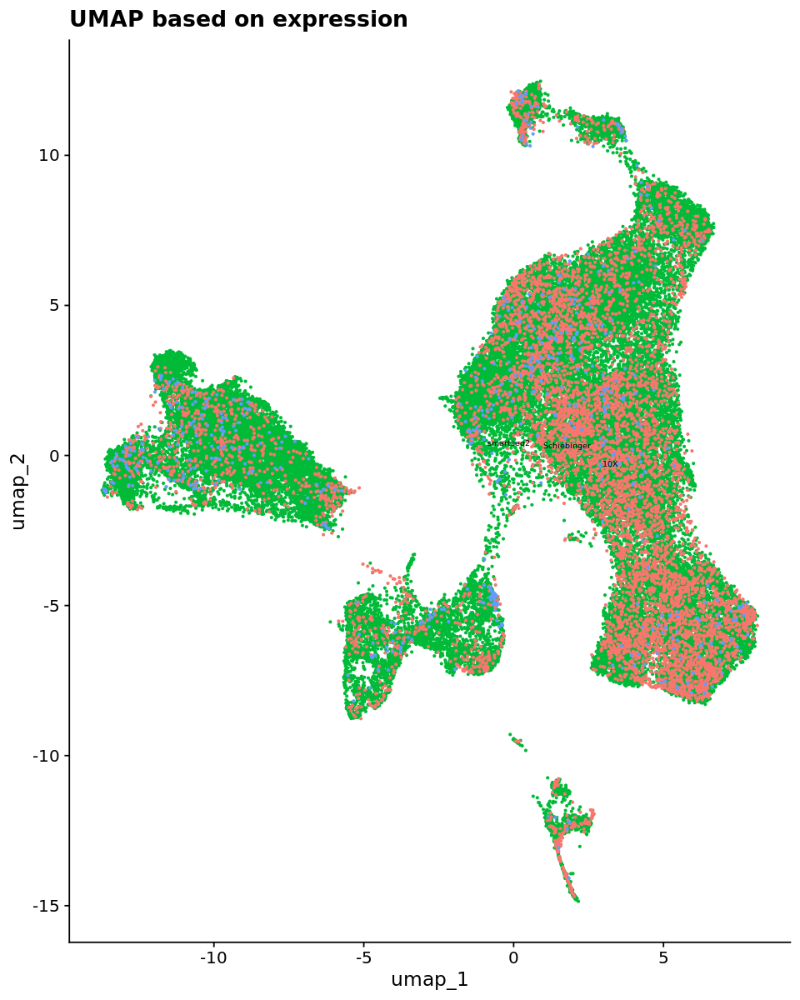

In [48]:
options(repr.plot.width=8, repr.plot.height = 10)
DimPlot(seurat_scenic, reduction = "umap_rna",repel = F,label.size = 2, label = TRUE, pt.size = 0.5) + NoLegend() +ggtitle("UMAP based on expression")

Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
"The following requested variables were not found: Egr"

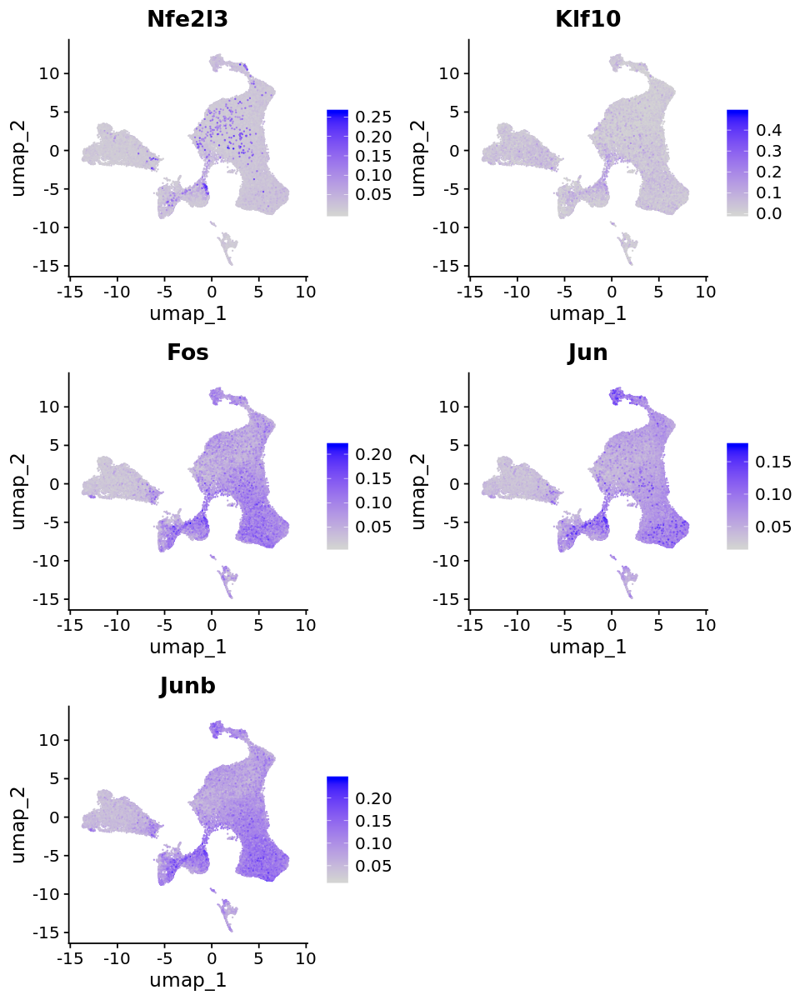

In [57]:
options(repr.plot.width=8, repr.plot.height = 10)
FeaturePlot(seurat_scenic, features = c('Nfe2l3', 'Klf10','Fos','Jun','Junb','Egr'), reduction = "umap_rna")

In [50]:
saveRDS(seurat_scenic,"SCENIC/Schiebinger/seurat_scenic.rds")

In [70]:
plot <- DimPlot(seurat_scenic, reduction = "umap",repel = F,label.size = 2, label = TRUE, pt.size = 0.5) + NoLegend()
#suppressMessages(HoverLocator(plot = plot, information = FetchData(object = seurat_EPSC_scenic, vars = 'cell_type')))

ERROR: Error in is.data.frame(x): object 'seurat_EPSC_scenic' not found


# RUN BATCH CORRECTION WITH SEURAT ON THE RESULTS OF SCENIC RUN ON ALL SAMPLES

In [205]:
# Split object
seurat_scenic.list <- SplitObject(seurat_scenic, split.by = "project")

In [206]:
seurat_scenic.list

$Schiebinger
An object of class Seurat 
499 features across 50000 samples within 1 assay 
Active assay: RNA (499 features)
 3 dimensional reductions calculated: pca, umap, umap_rna

$`10X`
An object of class Seurat 
499 features across 6969 samples within 1 assay 
Active assay: RNA (499 features)
 3 dimensional reductions calculated: pca, umap, umap_rna

$smartseq
An object of class Seurat 
499 features across 567 samples within 1 assay 
Active assay: RNA (499 features)
 3 dimensional reductions calculated: pca, umap, umap_rna


In [207]:
# find variable features
for (i in 1:length(seurat_scenic.list)) {
    #scenic_norm_seurat_int.list[[i]] <- NormalizeData(scenic_norm_seurat_int.list[[i]], verbose = FALSE)
    seurat_scenic.list[[i]] <- FindVariableFeatures(seurat_scenic.list[[i]], selection.method = "vst", 
    nfeatures = 2000, verbose = FALSE)
    #scenic_norm_seurat_int.list[[i]] <- SCTransform(scenic_norm_seurat_int.list[[i]], verbose = FALSE)
    
}

In [208]:
seurat_integration <- function(merged_seurat_object, 
                                dims_used = 20,  
                              k_filter = 200, 
                              k_anchors = 5, 
                              k_score = 30, 
                              integrate.all.features = TRUE,
                              n.features.to.integrate = 2000
                              ){
    # Find anchors
             anchors <- FindIntegrationAnchors(object.list = merged_seurat_object,
                                               dims = 1:dims_used, 
                                               k.filter = k_filter,
                                               k.anchor = k_anchors,
                                               k.score = k_score,
                                                  verbose = F)
    # Integrate features
        if(integrate.all.features == TRUE){
            integrated <- IntegrateData(anchorset = anchors, dims = 1:dims_used, features.to.integrate = 1:length(rownames(merged_seurat_object[[1]])))
            } else {
            integrated <- IntegrateData(anchorset = anchors, dims = 1:dims_used, features.to.integrate = 1:n.features.to.integrate)
        }
    
        DefaultAssay(integrated) <- "integrated"
        integrated <- ScaleData(integrated, verbose = FALSE)
        integrated <- RunPCA(integrated, npcs = dims_used, verbose = FALSE)
    
    # Run UMAP
        integrated <- RunUMAP(integrated, reduction = "pca", dims = 1:dims_used)
    
        
    return(integrated)
    
    
}

In [210]:
options(future.globals.maxSize=2684354560000)

### Test different integration parameters

In [220]:
grid_search_integration <- function(merged_seurat_object,
                              dims.used,  
                              k.filter, 
                              k.anchors, 
                              k.score,
                             pdf_name = "cross_integration.pdf") {
    # For each parameter take vector of values that will need to be tested.
    # Each parameter has to be given a vector
    
    
    print("Permuting...")
    # Generate all combination of params
    permutations <- as.matrix(crossing(dims.used, k.filter, k.anchors, k.score))
    
    print(paste("Starting integration for ", nrow(permutations)," different combinations of parameters."))
    # Integrate using different sets of params from permuts
     plot <- list()
    for (i in 1:nrow(permutations)) {
        
                                # Assign set of params per each iteration
                                  dims_used_perm <- permutations[i,1]  
                                  k_filter_perm <- permutations[i,2] 
                                  k_anchors_perm <- permutations[i,3] 
                                  k_score_perm <- permutations[i,4]
        
        print(paste("Integrating with ","dims_used = ",dims_used_perm," - k_filter = ",k_filter_perm," - k_anchors = ",k_anchors_perm," - k_score = ",k_score_perm,"..."))
                                # Integrate using set of params
        integrated_temp <-seurat_integration(merged_seurat_object,
                                dims_used = dims_used_perm,  
                                  k_filter = k_filter_perm, 
                                  k_anchors = k_anchors_perm, 
                                  k_score = k_score_perm)
        print("Finished")
        #Plot UMAP
        p1 <- DimPlot(integrated_temp, reduction = "umap",group.by = "time_point", repel = F,label.size = 3, label = TRUE, pt.size = 0.3) + NoLegend()+
                        ggtitle(paste("dims_used: ",dims_used_perm,", k_filter: ",k_filter_perm,",\nk_anchors: ",k_anchors_perm,", k_score: ",k_score_perm))
        p2 <- DimPlot(integrated_temp, reduction = "umap",group.by = "project", repel = F,label.size = 3, label = TRUE, pt.size = 0.3) + NoLegend()+
                        ggtitle(paste("dims_used: ",dims_used_perm,", k_filter: ",k_filter_perm,",\nk_anchors: ",k_anchors_perm,", k_score: ",k_score_perm))
        
        plot[[i]] <- CombinePlots(plots = list(p1, p2))
        }
       # Export to pdf
       pdf(pdf_name, onefile = TRUE, useDingbats = FALSE, width = 10, height = 10)
         for (i in 1:nrow(permutations)){
          plot(plot[[i]])
            }
       dev.off()
    print("Integration Grid Search FINISHED successfully.")
}

In [222]:
grid_search_integration(seurat_scenic.list,
                              dims.used=c(20,40),  
                             k.filter=c(NA,200), 
                             k.anchors=c(5,30), 
                             k.score=c(30, 70),
                             pdf_name = "SCENIC/Schiebinger/Schiebinger_10X_smartseq_SCENIC_integration_gridSearch.pdf")

[1] "Permuting..."
[1] "Starting integration for  16  different combinations of parameters."
[1] "Integrating with  dims_used =  20  - k_filter =  200  - k_anchors =  5  - k_score =  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"16:13:54 UMAP embedding parameters a = 0.9922 b = 1.112
16:13:54 Read 57536 rows and found 20 numeric columns
16:13:54 Using Annoy for neighbor search, n_neighbors = 30
16:13:54 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
16:14:03 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bd3af70903
16:14:03 Searching Annoy index using 1 thread, search_k = 3000
16:14:26 Annoy recall = 100%
16:14:27 Commencing smooth kNN distance calibration using 1 thread
16:14:30

[1] "Finished"
[1] "Integrating with  dims_used =  20  - k_filter =  200  - k_anchors =  5  - k_score =  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"16:32:03 UMAP embedding parameters a = 0.9922 b = 1.112
16:32:03 Read 57536 rows and found 20 numeric columns
16:32:03 Using Annoy for neighbor search, n_neighbors = 30
16:32:03 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
16:32:12 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bd3cba4277
16:32:12 Searching Annoy index using 1 thread, search_k = 3000
16:32:35 Annoy recall = 100%
16:32:37 Commencing smooth kNN distance calibration using 1 thread
16:32:42

[1] "Finished"
[1] "Integrating with  dims_used =  20  - k_filter =  200  - k_anchors =  30  - k_score =  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"16:48:22 UMAP embedding parameters a = 0.9922 b = 1.112
16:48:22 Read 57536 rows and found 20 numeric columns
16:48:22 Using Annoy for neighbor search, n_neighbors = 30
16:48:22 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
16:48:31 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bd732cdef5
16:48:31 Searching Annoy index using 1 thread, search_k = 3000
16:48:55 Annoy recall = 100%
16:48:56 Commencing smooth kNN distance calibration using 1 thread
16:49:00

[1] "Finished"
[1] "Integrating with  dims_used =  20  - k_filter =  200  - k_anchors =  30  - k_score =  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"17:08:07 UMAP embedding parameters a = 0.9922 b = 1.112
17:08:07 Read 57536 rows and found 20 numeric columns
17:08:07 Using Annoy for neighbor search, n_neighbors = 30
17:08:07 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
17:08:16 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bd1ba21f75
17:08:16 Searching Annoy index using 1 thread, search_k = 3000
17:08:39 Annoy recall = 100%
17:08:40 Commencing smooth kNN distance calibration using 1 thread
17:08:44

[1] "Finished"
[1] "Integrating with  dims_used =  20  - k_filter =  NA  - k_anchors =  5  - k_score =  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"17:20:59 UMAP embedding parameters a = 0.9922 b = 1.112
17:20:59 Read 57536 rows and found 20 numeric columns
17:20:59 Using Annoy for neighbor search, n_neighbors = 30
17:20:59 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
17:21:08 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bdc7b7c8b
17:21:08 Searching Annoy index using 1 thread, search_k = 3000
17:21:31 Annoy recall = 100%
17:21:32 Commencing smooth kNN distance calibration using 1 thread
17:21:36 

[1] "Finished"
[1] "Integrating with  dims_used =  20  - k_filter =  NA  - k_anchors =  5  - k_score =  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"17:38:07 UMAP embedding parameters a = 0.9922 b = 1.112
17:38:07 Read 57536 rows and found 20 numeric columns
17:38:07 Using Annoy for neighbor search, n_neighbors = 30
17:38:07 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
17:38:15 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bdf15e79
17:38:15 Searching Annoy index using 1 thread, search_k = 3000
17:38:39 Annoy recall = 100%
17:38:41 Commencing smooth kNN distance calibration using 1 thread
17:38:45 I

[1] "Finished"
[1] "Integrating with  dims_used =  20  - k_filter =  NA  - k_anchors =  30  - k_score =  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"17:58:00 UMAP embedding parameters a = 0.9922 b = 1.112
17:58:01 Read 57536 rows and found 20 numeric columns
17:58:01 Using Annoy for neighbor search, n_neighbors = 30
17:58:01 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
17:58:10 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bd305edf47
17:58:10 Searching Annoy index using 1 thread, search_k = 3000
17:58:34 Annoy recall = 100%
17:58:35 Commencing smooth kNN distance calibration using 1 thread
17:58:39

[1] "Finished"
[1] "Integrating with  dims_used =  20  - k_filter =  NA  - k_anchors =  30  - k_score =  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"18:21:36 UMAP embedding parameters a = 0.9922 b = 1.112
18:21:36 Read 57536 rows and found 20 numeric columns
18:21:36 Using Annoy for neighbor search, n_neighbors = 30
18:21:36 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
18:21:44 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bd7bcc63a0
18:21:44 Searching Annoy index using 1 thread, search_k = 3000
18:22:08 Annoy recall = 100%
18:22:09 Commencing smooth kNN distance calibration using 1 thread
18:22:13

[1] "Finished"
[1] "Integrating with  dims_used =  40  - k_filter =  200  - k_anchors =  5  - k_score =  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"18:44:36 UMAP embedding parameters a = 0.9922 b = 1.112
18:44:36 Read 57536 rows and found 40 numeric columns
18:44:36 Using Annoy for neighbor search, n_neighbors = 30
18:44:36 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
18:44:46 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bd1ecb862a
18:44:46 Searching Annoy index using 1 thread, search_k = 3000
18:45:10 Annoy recall = 100%
18:45:11 Commencing smooth kNN distance calibration using 1 thread
18:45:14

[1] "Finished"
[1] "Integrating with  dims_used =  40  - k_filter =  200  - k_anchors =  5  - k_score =  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"19:10:53 UMAP embedding parameters a = 0.9922 b = 1.112
19:10:53 Read 57536 rows and found 40 numeric columns
19:10:53 Using Annoy for neighbor search, n_neighbors = 30
19:10:53 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
19:11:03 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bd1b73b2c4
19:11:03 Searching Annoy index using 1 thread, search_k = 3000
19:11:28 Annoy recall = 100%
19:11:29 Commencing smooth kNN distance calibration using 1 thread
19:11:32

[1] "Finished"
[1] "Integrating with  dims_used =  40  - k_filter =  200  - k_anchors =  30  - k_score =  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"19:35:42 UMAP embedding parameters a = 0.9922 b = 1.112
19:35:42 Read 57536 rows and found 40 numeric columns
19:35:42 Using Annoy for neighbor search, n_neighbors = 30
19:35:42 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
19:35:51 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bdfa0a410
19:35:51 Searching Annoy index using 1 thread, search_k = 3000
19:36:16 Annoy recall = 100%
19:36:17 Commencing smooth kNN distance calibration using 1 thread
19:36:21 

[1] "Finished"
[1] "Integrating with  dims_used =  40  - k_filter =  200  - k_anchors =  30  - k_score =  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"20:00:34 UMAP embedding parameters a = 0.9922 b = 1.112
20:00:34 Read 57536 rows and found 40 numeric columns
20:00:34 Using Annoy for neighbor search, n_neighbors = 30
20:00:34 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
20:00:43 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bd5fdaa766
20:00:43 Searching Annoy index using 1 thread, search_k = 3000
20:01:07 Annoy recall = 100%
20:01:08 Commencing smooth kNN distance calibration using 1 thread
20:01:11

[1] "Finished"
[1] "Integrating with  dims_used =  40  - k_filter =  NA  - k_anchors =  5  - k_score =  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"20:18:32 UMAP embedding parameters a = 0.9922 b = 1.112
20:18:32 Read 57536 rows and found 40 numeric columns
20:18:32 Using Annoy for neighbor search, n_neighbors = 30
20:18:32 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
20:18:41 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bd12b832a8
20:18:41 Searching Annoy index using 1 thread, search_k = 3000
20:19:05 Annoy recall = 100%
20:19:05 Commencing smooth kNN distance calibration using 1 thread
20:19:09

[1] "Finished"
[1] "Integrating with  dims_used =  40  - k_filter =  NA  - k_anchors =  5  - k_score =  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"20:38:52 UMAP embedding parameters a = 0.9922 b = 1.112
20:38:52 Read 57536 rows and found 40 numeric columns
20:38:52 Using Annoy for neighbor search, n_neighbors = 30
20:38:52 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
20:39:01 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bd482a992b
20:39:01 Searching Annoy index using 1 thread, search_k = 3000
20:39:25 Annoy recall = 100%
20:39:26 Commencing smooth kNN distance calibration using 1 thread
20:39:29

[1] "Finished"
[1] "Integrating with  dims_used =  40  - k_filter =  NA  - k_anchors =  30  - k_score =  30 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"21:04:36 UMAP embedding parameters a = 0.9922 b = 1.112
21:04:36 Read 57536 rows and found 40 numeric columns
21:04:36 Using Annoy for neighbor search, n_neighbors = 30
21:04:36 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
21:04:45 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bd43a50229
21:04:45 Searching Annoy index using 1 thread, search_k = 3000
21:05:09 Annoy recall = 100%
21:05:10 Commencing smooth kNN distance calibration using 1 thread
21:05:13

[1] "Finished"
[1] "Integrating with  dims_used =  40  - k_filter =  NA  - k_anchors =  30  - k_score =  70 ..."


Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"21:31:35 UMAP embedding parameters a = 0.9922 b = 1.112
21:31:35 Read 57536 rows and found 40 numeric columns
21:31:35 Using Annoy for neighbor search, n_neighbors = 30
21:31:35 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
21:31:44 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bd2cd1d72f
21:31:44 Searching Annoy index using 1 thread, search_k = 3000
21:32:08 Annoy recall = 100%
21:32:08 Commencing smooth kNN distance calibration using 1 thread
21:32:11

[1] "Finished"
[1] "Integration Grid Search FINISHED successfully."


In [223]:
seurat_scenic.int <- seurat_integration(seurat_scenic.list, 
                                        dims_used = 20,  
                              k_filter = NA, 
                              k_anchors = 30, 
                              k_score = 30, )

Merging dataset 3 into 1
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Merging dataset 2 into 1 3
Extracting anchors for merged samples
Finding integration vectors
Finding integration vector weights
Integrating data
Warning message:
"Adding a command log without an assay associated with it"11:33:01 UMAP embedding parameters a = 0.9922 b = 1.112
11:33:01 Read 57536 rows and found 20 numeric columns
11:33:01 Using Annoy for neighbor search, n_neighbors = 30
11:33:01 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
11:33:09 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bdb0790d1
11:33:09 Searching Annoy index using 1 thread, search_k = 3000
11:33:32 Annoy recall = 100%
11:33:32 Commencing smooth kNN distance calibration using 1 thread
11:33:36 

In [224]:
DefaultAssay(seurat_scenic.int) <- "integrated"

In [225]:
seurat_scenic.int <- ScaleData(seurat_scenic.int, verbose = FALSE)

In [230]:
seurat_scenic.int <- RunPCA(seurat_scenic.int, npcs = 25, verbose = FALSE)
seurat_scenic.int <- RunUMAP(seurat_scenic.int, reduction = "pca", dims = 1:25)

12:09:40 UMAP embedding parameters a = 0.9922 b = 1.112
12:09:40 Read 57536 rows and found 25 numeric columns
12:09:40 Using Annoy for neighbor search, n_neighbors = 30
12:09:40 Building Annoy index with metric = cosine, n_trees = 50
0%   10   20   30   40   50   60   70   80   90   100%
[----|----|----|----|----|----|----|----|----|----|
**************************************************|
12:09:49 Writing NN index file to temp file /tmp/RtmpSzofK3/file70bd4cb05317
12:09:49 Searching Annoy index using 1 thread, search_k = 3000
12:10:12 Annoy recall = 100%
12:10:13 Commencing smooth kNN distance calibration using 1 thread
12:10:16 Initializing from normalized Laplacian + noise
12:10:18 Commencing optimization for 200 epochs, with 2644702 positive edges
12:11:24 Optimization finished


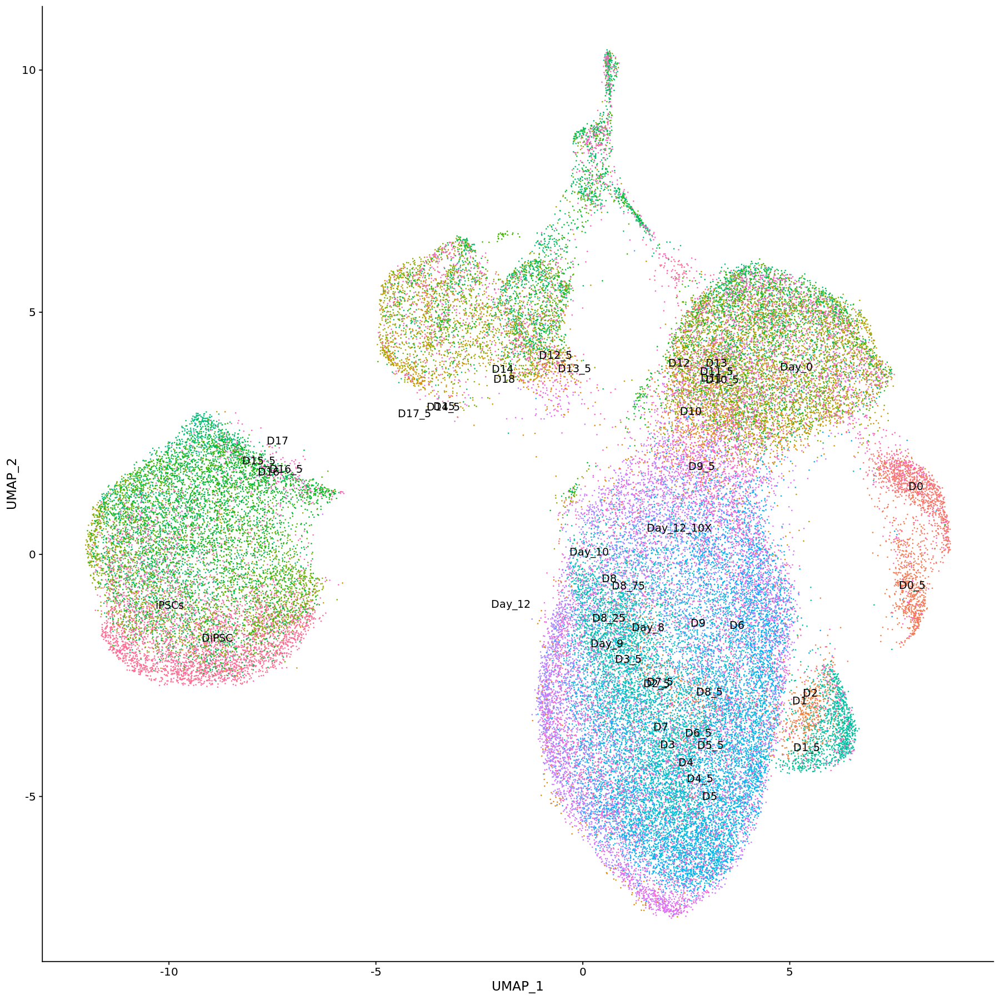

In [286]:
options(repr.plot.width=15, repr.plot.height = 15)
DimPlot(seurat_scenic.int, group.by = "time_point", label = T,pt.size = 0.1) + NoLegend()

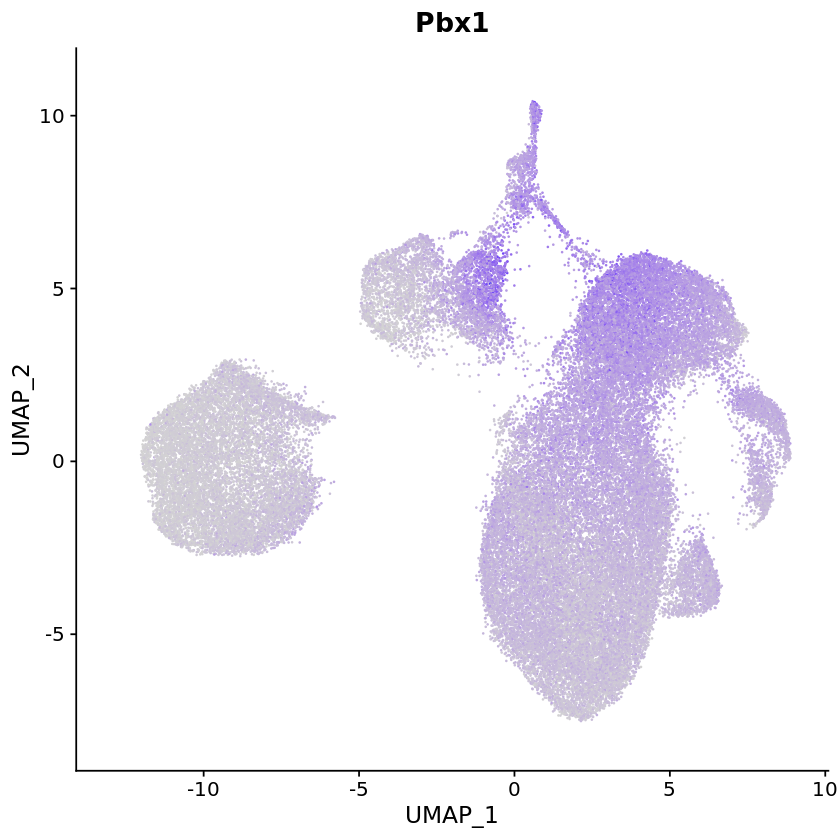

In [240]:
FeaturePlot(seurat_scenic.int, features="Pbx1",pt.size = 0.1) + NoLegend()

In [82]:
#scenic_norm_seurat_int.integrated <- readRDS("scenic_norm_seurat_int.integrated.rds")

In [241]:
saveRDS(seurat_scenic.int, "SCENIC/Schiebinger/Schiebinger_smartseq_tenx_integrated_SCENIC.rds")

In [7]:
seurat_scenic.int = readRDS("SCENIC/Schiebinger/Schiebinger_smartseq_tenx_integrated_SCENIC.rds")

In [10]:
unique(seurat_scenic.int@meta.data$time_point)

[1] "DiPSC"      "D8_5"       "D4"         "D12_5"      "D3"        
 [6] "D18"        "D9_5"       "D9"         "D7"         "D6_5"      
[11] "D16"        "D5"         "D14_5"      "D2"         "D8_75"     
[16] "D14"        "D15_5"      "D17"        "D5_5"       "D10_5"     
[21] "D3_5"       "D16_5"      "D13"        "D11_5"      "D12"       
[26] "D2_5"       "D11"        "D8_25"      "D17_5"      "D4_5"      
[31] "D10"        "D13_5"      "D0_5"       "D15"        "D8"        
[36] "D7_5"       "D6"         "D1_5"       "D0"         "D1"        
[41] "Day_12_10X" "Day_9"      "Day_10"     "Day_0"      "Day_8"     
[46] "Day_12"     "iPSCs"

In [8]:
# Define the number of colors you want
library(RColorBrewer)
nb.cols <- 47
mycolors <- colorRampPalette(brewer.pal(8, "Set2"))(nb.cols)

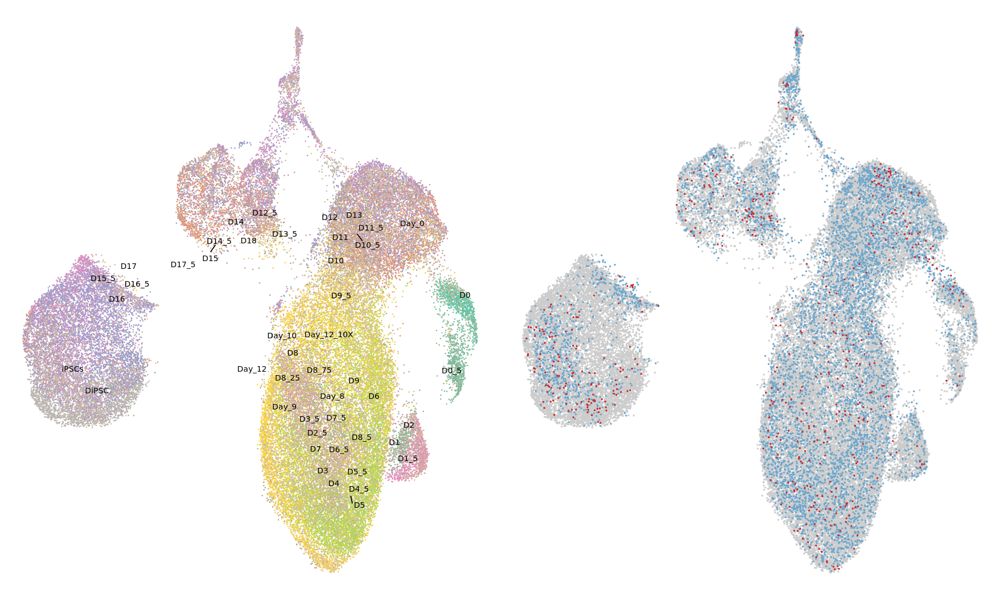

In [9]:
options(repr.plot.width=15, repr.plot.height = 9)
p1 <- DimPlot(seurat_scenic.int, reduction = "umap",group.by = "time_point", repel = T,label.size = 3, label = T, pt.size = 0.1)  + scale_color_manual(values=mycolors) + theme_void() + NoLegend()
p2 <- DimPlot(seurat_scenic.int, reduction = "umap",group.by = "project", repel = F,label.size = 3, label = F, pt.size = 0.3) + 
                scale_color_manual(values = c("skyblue3","grey80","firebrick3")) + theme_void() +NoLegend()

CombinePlots(plots = list(p1,p2))

In [11]:
getwd()

[1] "/ddn1/vol1/staging/leuven/stg_00041/Adrian/AJ_0069_Schiebinger_SCENIC/SCENIC_interpretation"

In [13]:
# Exporting

## BY Timepoint
pdf("SCENIC/Schiebinger/Integration_SCENIC_byTimepoint_NoLegend.pdf", useDingbats = FALSE, width = 7.5, height = 9)
 DimPlot(seurat_scenic.int, reduction = "umap",group.by = "time_point", repel = T,label.size = 3, label = T, pt.size = 0.1)  + scale_color_manual(values=mycolors) + theme_void() + NoLegend()
dev.off()

pdf("SCENIC/Schiebinger/Integration_SCENIC_byTimepoint.pdf", useDingbats = FALSE, width = 9, height = 9)
 DimPlot(seurat_scenic.int, reduction = "umap",group.by = "time_point", repel = T,label.size = 3, label = T, pt.size = 0.1)  + scale_color_manual(values=mycolors) + theme_void()
dev.off()

## BY Dataset
pdf("SCENIC/Schiebinger/Integration_SCENIC_byDataset_NoLegend.pdf", useDingbats = FALSE, width = 7.5, height = 9)
DimPlot(seurat_scenic.int, reduction = "umap",group.by = "project", repel = F,label.size = 3, label = F, pt.size = 0.3) + 
                scale_color_manual(values = c("skyblue3","grey80","firebrick3")) + theme_void() +NoLegend()
dev.off()

pdf("SCENIC/Schiebinger/Integration_SCENIC_byDataset.pdf", useDingbats = FALSE, width = 9, height = 9)
DimPlot(seurat_scenic.int, reduction = "umap",group.by = "project", repel = F,label.size = 3, label = F, pt.size = 0.3) + 
                scale_color_manual(values = c("skyblue3","grey80","firebrick3")) + theme_void()
dev.off()

png 
  2

png 
  2

png 
  2

png 
  2

In [4]:
Idents(seurat_scenic.int) <- "time_point"

Warning message:
"Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session."Warning message:
"Graphs cannot be vertically aligned unless the axis parameter is set. Placing graphs unaligned."

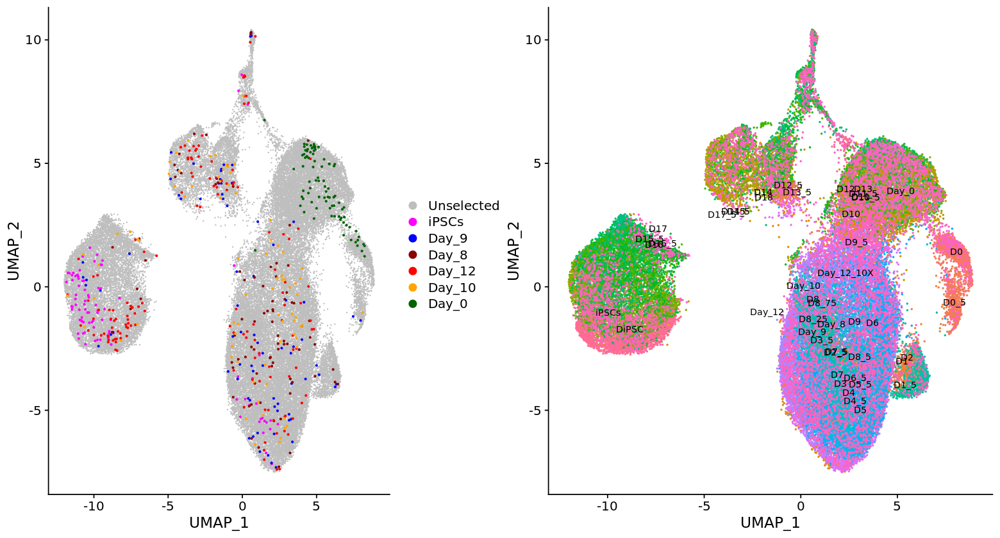

In [5]:
smartseq2 <- list(Day_0 = WhichCells(seurat_scenic.int, idents = c("Day_0")),
                        Day_8 = WhichCells(seurat_scenic.int, idents = c("Day_8")),
                        Day_9 = WhichCells(seurat_scenic.int, idents = c("Day_9")),
                        Day_10 = WhichCells(seurat_scenic.int, idents = c("Day_10")),
                      Day_12 = WhichCells(seurat_scenic.int, idents = c("Day_12")),
                 iPSCs = WhichCells(seurat_scenic.int, idents = c("iPSCs")))


options(repr.plot.width=13, repr.plot.height = 7)
p1 <- DimPlot(seurat_scenic.int, label=F, 
        cells.highlight= smartseq2 , cols.highlight = c("magenta", "blue","darkred", "red", "orange","darkgreen"), cols= "grey", sizes.highlight = 0.5)

p2 <- DimPlot(seurat_scenic.int, reduction = "umap",group.by = "time_point", repel = F,label.size = 3, label = TRUE, pt.size = 0.3) + NoLegend()

CombinePlots(plots = list(p1, p2))

Warning message:
"Graphs cannot be vertically aligned unless the axis parameter is set. Placing graphs unaligned."

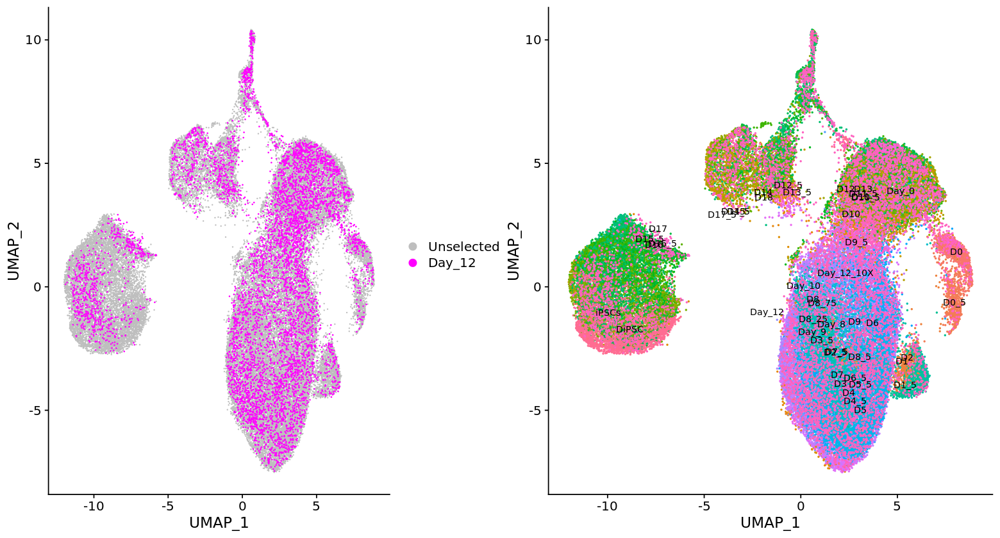

In [6]:
TENX <- list(Day_12 = WhichCells(seurat_scenic.int, idents = c("Day_12_10X")))


options(repr.plot.width=13, repr.plot.height = 7)
p1 <- DimPlot(seurat_scenic.int, label=F, 
        cells.highlight= TENX , cols.highlight = c("magenta"), cols= "grey", sizes.highlight = 0.1)

p2 <- DimPlot(seurat_scenic.int, reduction = "umap",group.by = "time_point", repel = F,label.size = 3, label = TRUE, pt.size = 0.3) + NoLegend()

CombinePlots(plots = list(p1, p2))

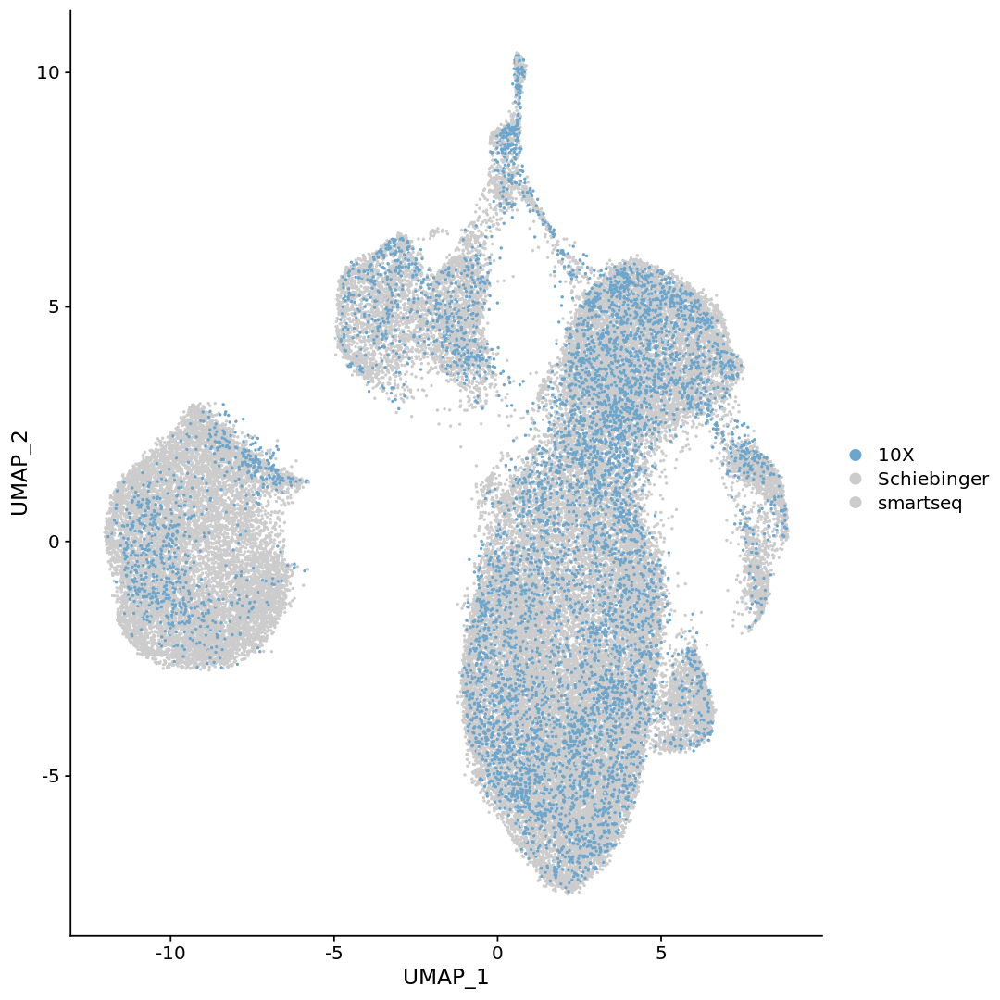

In [7]:
options(repr.plot.width=9, repr.plot.height = 9)
DimPlot(seurat_scenic.int, reduction = "umap",group.by = "project", repel = F,label.size = 3, label = F, pt.size = 0.3) +
scale_color_manual(values = c("skyblue3","grey80","grey80"))#"firebrick3"

In [21]:
regulon_act_plot <- function(object, regulon, reduction = "umap") {

FeaturePlot(object, features = c(regulon), reduction = reduction, pt.size = .1)+ scale_color_viridis(option = "C") + labs(#title = "Single-cell gene regulatory atlas\nof integrated mouse iPSC reprogramming",
              title = paste(toupper(regulon), " activity")) +
theme(
  plot.title = element_text(hjust = 0),
  plot.subtitle = element_text(hjust = 0))+
theme(axis.line=element_blank(),axis.text.x=element_blank(),
          axis.text.y=element_blank(),axis.ticks=element_blank(),
          axis.title.x=element_blank(),
          axis.title.y=element_blank(),#legend.position="none",
          panel.background=element_blank(),panel.border=element_blank(),panel.grid.major=element_blank(),
          panel.grid.minor=element_blank(),plot.background=element_blank())
    }

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


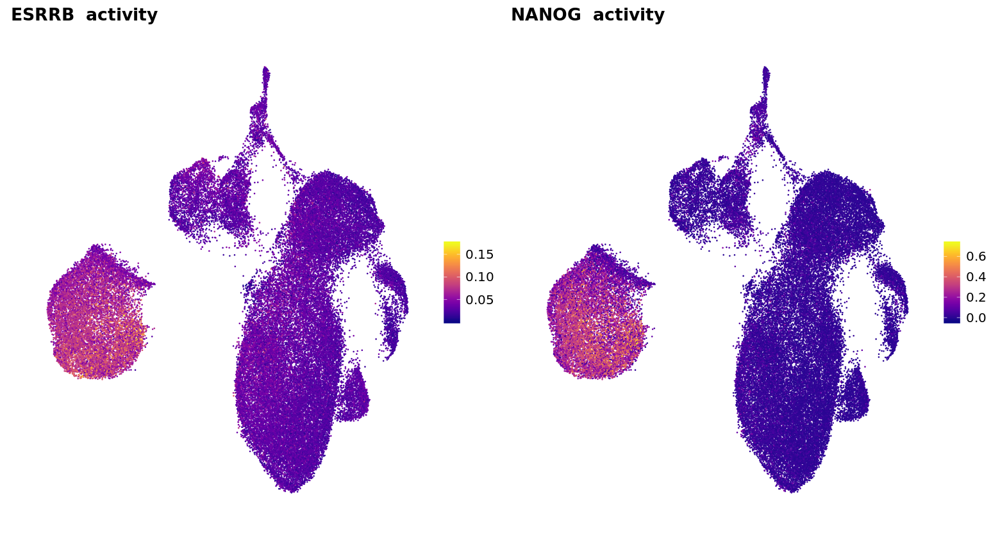

In [61]:
options(repr.plot.width=13, repr.plot.height = 7)
p1 <- regulon_act_plot(seurat_scenic.int, "Esrrb")
p2 <- regulon_act_plot(seurat_scenic.int, "Nanog")
CombinePlots(plots = list(p1, p2))

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


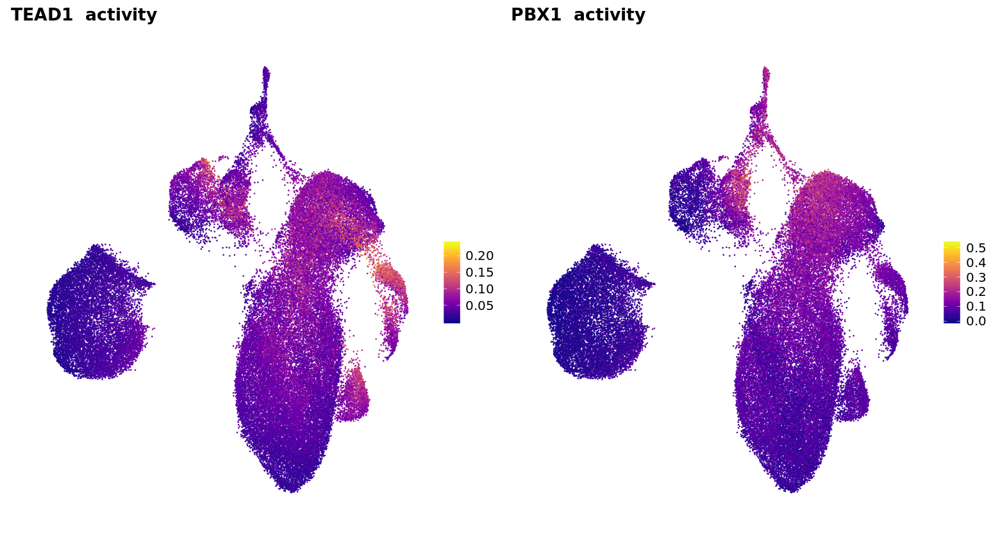

In [62]:
options(repr.plot.width=13, repr.plot.height = 7)
p1 <- regulon_act_plot(seurat_scenic.int, "Tead1")
p2 <- regulon_act_plot(seurat_scenic.int, "Pbx1")
CombinePlots(plots = list(p1, p2))

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


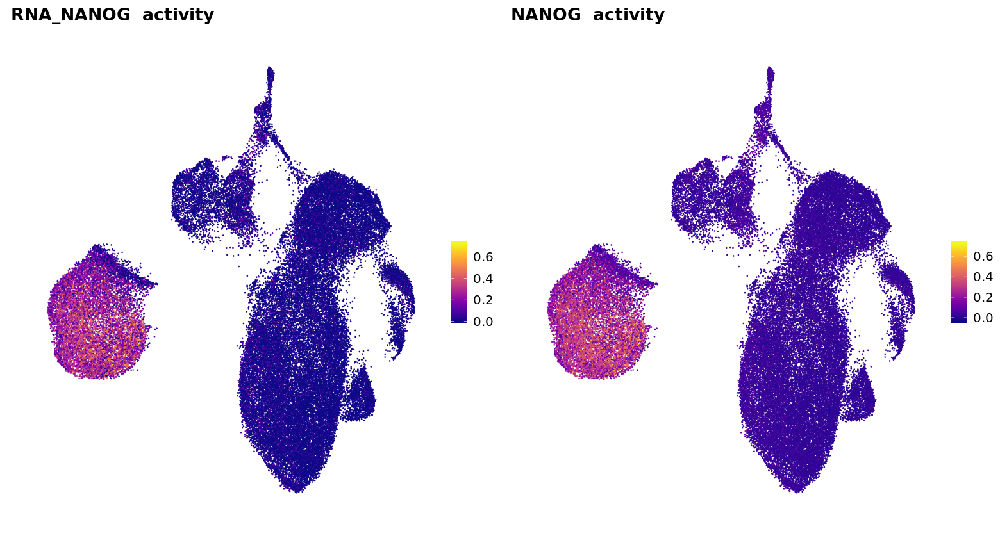

In [52]:
options(repr.plot.width=13, repr.plot.height = 7)
p1 <- regulon_act_plot(seurat_scenic.int, "rna_Nanog")
p2 <- regulon_act_plot(seurat_scenic.int, "Nanog")
CombinePlots(plots = list(p1, p2))

In [18]:
# Add UMAP coords for expr based umap
seurat_scenic.int[["umap_rna"]] <- CreateDimReducObject(embeddings = int_expr_UMAP_coords, key = "umap_rna_", assay = DefaultAssay(seurat_scenic.int))

Warning message:
"All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to umap_"

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


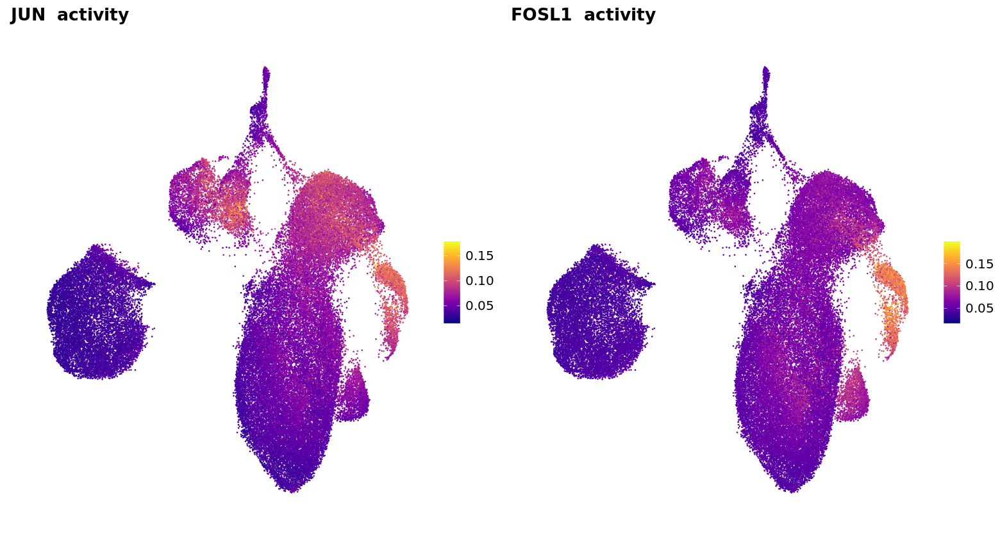

In [22]:
options(repr.plot.width=13, repr.plot.height = 7)
p1 <- regulon_act_plot(seurat_scenic.int, "Jun", reduction = "umap")
p2 <- regulon_act_plot(seurat_scenic.int, "Fosl1", reduction = "umap")
CombinePlots(plots = list(p1, p2))

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.


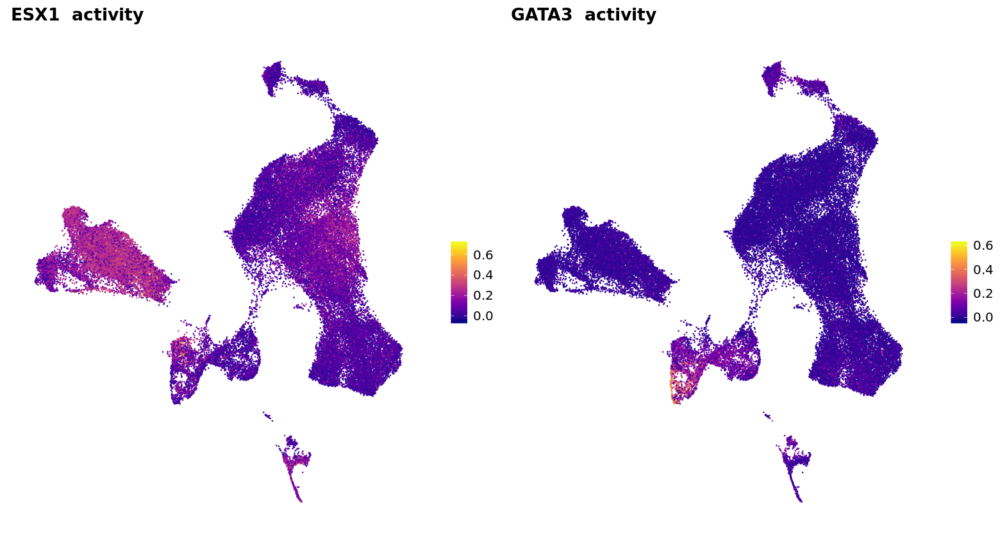

In [23]:
options(repr.plot.width=13, repr.plot.height = 7)
p1 <- regulon_act_plot(seurat_scenic.int, "Esx1", reduction = "umap_rna")
p2 <- regulon_act_plot(seurat_scenic.int, "Gata3", reduction = "umap_rna")
CombinePlots(plots = list(p1, p2))

# Add AUCell (signatures/identities) meta data (generated in AJ_0069.1) to the object with regulons activity

In [4]:
schieb_smart_tenx_integrated_meta_data <- read_csv("Schiebinger_integration/schieb_smart_tenx_integrated_meta_data.csv")

Warning message:
"Missing column names filled in: 'X1' [1]"Parsed with column specification:
cols(
  .default = col_double(),
  X1 = col_character(),
  orig.ident = col_character(),
  cell_ID = col_character(),
  time_point = col_character(),
  cell_number = col_character(),
  Experiment = col_character(),
  condition = col_character(),
  Dox_status = col_character(),
  project = col_character(),
  percent.mt = col_logical(),
  RNA_snn_res.0.3 = col_logical(),
  seurat_clusters = col_logical(),
  RNA_snn_res.0.2 = col_logical(),
  RNA_snn_res.0.15 = col_logical(),
  Xi = col_logical(),
  Cell = col_logical(),
  GC_index1_index2 = col_logical(),
  Name = col_logical(),
  RNA_snn_res.0.5 = col_logical(),
  identity = col_character()
)
See spec(...) for full column specifications.
Warning message:
"22294 parsing failures.
  row             col           expected           actual                                                                                                     file
50001 

In [26]:
head(schieb_smart_tenx_integrated_meta_data)

X1,orig.ident,nCount_RNA,nFeature_RNA,cell_ID,time_point,cell_number,Experiment,condition,Dox_status,...,RadialGlia-Id3,RadialGlia-Gdf10,RadialGlia-Neurog2,Long-term.MEFs,Embryonic.mesenchyme,Cxcl12.co-expressed,Ifitm1.co-expressed,Matn4.co-expressed,twoCell,identity
Schiebinger_DiPSC_2i_C1_CCATGTCAGACTAGGC.1,DiPSC,3113.147,3137,DiPSC_2i_C1_CCATGTCAGACTAGGC-1,DiPSC,2i,GSE115943,2i,no_Dox,...,0.09320694,0.10975536,0.1252858,0.4179708,0.4204612,0.04428184,0.05639921,0.01006621,0.07696363,Pluripotent
Schiebinger_D8.5_2i_C1_CGGACTGGTAATTGGA.1,D8.5,3034.758,3228,D8.5_2i_C1_CGGACTGGTAATTGGA-1,D8_5,2i,GSE115943,2i,no_Dox,...,0.07302391,0.11134712,0.1146914,0.4701494,0.4199511,0.03003312,0.04479876,0.00000000,0.07296463,other
Schiebinger_D4_Dox_C1_AGAGCTTCAGGAATGC.1,D4,3158.778,3363,D4_Dox_C1_AGAGCTTCAGGAATGC-1,D4,Dox,GSE115943,serum,Dox,...,0.09154777,0.12086138,0.1221853,0.4518058,0.4147137,0.03852092,0.05200379,0.00000000,0.06478116,other
Schiebinger_D12.5_2i_C1_GTCTTCGGTGACGGTA.1,D12.5,3464.387,3863,D12.5_2i_C1_GTCTTCGGTGACGGTA-1,D12_5,2i,GSE115943,2i,no_Dox,...,0.10569732,0.06663095,0.1196913,0.3739046,0.3658494,0.04310309,0.05812290,0.00000000,0.06689617,Epithelial
Schiebinger_D3_Dox_C2_TCTGGAAAGCTGCGAA.1,D3,3299.385,3772,D3_Dox_C2_TCTGGAAAGCTGCGAA-1,D3,Dox,GSE115943,serum,Dox,...,0.10816533,0.11925925,0.1297189,0.4313974,0.3952877,0.03736708,0.02140826,0.00000000,0.07566533,other
Schiebinger_D18_2i_C2_TGCACCTTCTTCTGGC.1,D18,2358.662,2562,D18_2i_C2_TGCACCTTCTTCTGGC-1,D18,2i,GSE115943,2i,no_Dox,...,0.10760018,0.09797185,0.1244839,0.3275928,0.3516642,0.23899906,0.17123158,0.06454218,0.05217244,Senescent


In [24]:
head(seurat_scenic.int@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,cell_ID,time_point,cell_number,Experiment,condition,Dox_status,project,percent.mt,RNA_snn_res.0.3,seurat_clusters,RNA_snn_res.0.2,RNA_snn_res.0.15,Xi,Cell,GC_index1_index2,Name,RNA_snn_res.0.5
Schiebinger_DiPSC_2i_C1_CCATGTCAGACTAGGC.1,DiPSC,11.280144,307,DiPSC_2i_C1_CCATGTCAGACTAGGC-1,DiPSC,2i,GSE115943,2i,no_Dox,Schiebinger,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
Schiebinger_D8.5_2i_C1_CGGACTGGTAATTGGA.1,D8.5,9.086489,289,D8.5_2i_C1_CGGACTGGTAATTGGA-1,D8_5,2i,GSE115943,2i,no_Dox,Schiebinger,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
Schiebinger_D4_Dox_C1_AGAGCTTCAGGAATGC.1,D4,9.001522,278,D4_Dox_C1_AGAGCTTCAGGAATGC-1,D4,Dox,GSE115943,serum,Dox,Schiebinger,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
Schiebinger_D12.5_2i_C1_GTCTTCGGTGACGGTA.1,D12.5,13.485588,317,D12.5_2i_C1_GTCTTCGGTGACGGTA-1,D12_5,2i,GSE115943,2i,no_Dox,Schiebinger,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
Schiebinger_D3_Dox_C2_TCTGGAAAGCTGCGAA.1,D3,11.233253,298,D3_Dox_C2_TCTGGAAAGCTGCGAA-1,D3,Dox,GSE115943,serum,Dox,Schiebinger,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
Schiebinger_D18_2i_C2_TGCACCTTCTTCTGGC.1,D18,13.478300,331,D18_2i_C2_TGCACCTTCTTCTGGC-1,D18,2i,GSE115943,2i,no_Dox,Schiebinger,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [25]:
schieb_smart_tenx_integrated_meta_data$X1 <- gsub('-', '.', schieb_smart_tenx_integrated_meta_data$X1)

In [30]:
seurat_scenic.int@meta.data$identity <- schieb_smart_tenx_integrated_meta_data$identity

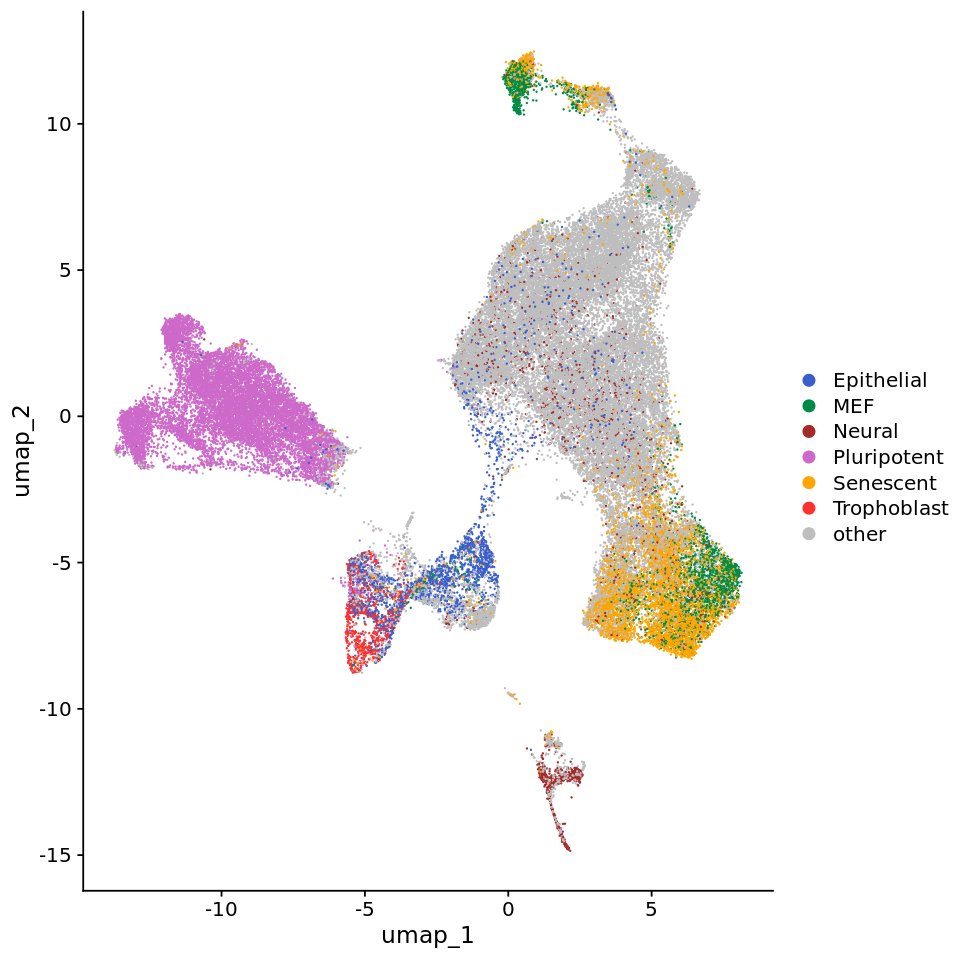

In [122]:
options(repr.plot.width=8, repr.plot.height = 8)
DimPlot(seurat_scenic.int, reduction = "umap_rna",group.by = "identity") + scale_color_manual(values=c("royalblue3","springgreen4","brown","orchid3","orange","firebrick1","grey"))

In [ ]:
pdf("Schiebinger_integration/seurat_int_AUC_Identities.pdf", useDingbats = FALSE)
DimPlot(seurat_scenic.int, reduction = "umap_rna",group.by = "identity") + scale_color_manual(values=c("royalblue3","springgreen4","brown","orchid3","orange","firebrick1","grey"))
dev.off()

# Plot activity of regulons across cells from different identities

In [35]:
Idents(seurat_scenic.int) <- "identity"

In [106]:
DefaultAssay(object = seurat_scenic.int) <- "RNA"

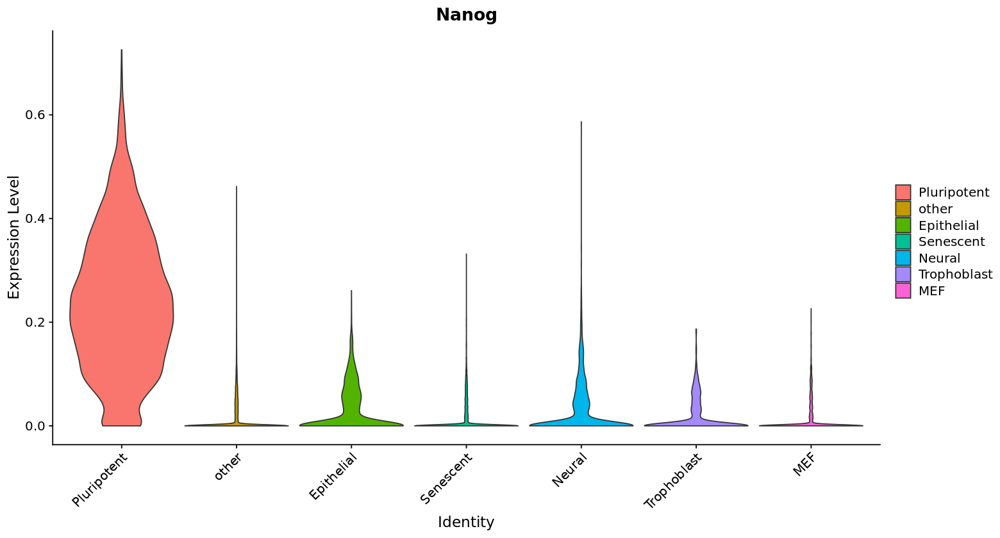

In [55]:
VlnPlot(seurat_scenic.int,pt.size = 0, features = "Nanog")

In [56]:
cluster.averages.scenic <- AverageExpression(seurat_scenic.int, return.seurat = TRUE)
cluster.averages.scenic

Finished averaging RNA for cluster Pluripotent
Finished averaging RNA for cluster other
Finished averaging RNA for cluster Epithelial
Finished averaging RNA for cluster Senescent
Finished averaging RNA for cluster Neural
Finished averaging RNA for cluster Trophoblast
Finished averaging RNA for cluster MEF
Finished averaging integrated for cluster Pluripotent
Finished averaging integrated for cluster other
Finished averaging integrated for cluster Epithelial
Finished averaging integrated for cluster Senescent
Finished averaging integrated for cluster Neural
Finished averaging integrated for cluster Trophoblast
Finished averaging integrated for cluster MEF
Centering and scaling data matrix


An object of class Seurat 
998 features across 7 samples within 2 assays 
Active assay: RNA (499 features)
 1 other assay present: integrated

In [85]:
mapal <- colorRampPalette(RColorBrewer::brewer.pal(11,"RdBu"))(256)

Warning message in DoHeatmap(cluster.averages.scenic, features = c("Esx1", "Pou5f1", :
"The following features were omitted as they were not found in the scale.data slot for the RNA assay: Arid3a, Ehf, Ovol1, Grhl3"Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


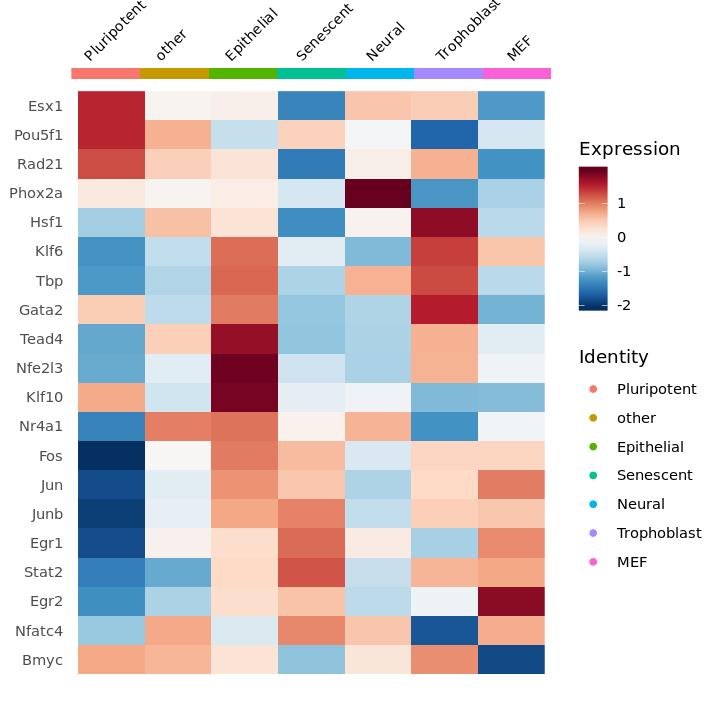

In [128]:
options(repr.plot.width=6, repr.plot.height = 6)
intermediate_regulons_identity <- DoHeatmap(cluster.averages.scenic,  features = c("Esx1","Pou5f1","Rad21",
                                                "Phox2a",
                                                "Hsf1","Klf6","Tbp","Gata2",
                                                "Tead4","Grhl3","Ovol1","Nfe2l3","Ehf","Klf10","Nr4a1",
    
    
                                                "Arid3a","Fos","Jun","Junb","Egr1",
                                                "Stat2","Egr2","Nfatc4","Bmyc"), size = 3, 
    draw.lines = FALSE) + scale_fill_viridis()+scale_fill_gradientn(colours = rev(mapal))
intermediate_regulons_identity

In [129]:
pdf("SCENIC/Schiebinger/seurat_scenic.int_inter_regulons_identity.pdf", useDingbats = FALSE)
intermediate_regulons_identity
dev.off()

png 
  2

Warning message in DoHeatmap(cluster.averages.scenic, features = c("Hic1", "Stat3", :
"The following features were omitted as they were not found in the scale.data slot for the RNA assay: Gli3, Mecom, Akr1a1, Twist2, Prrx2, Dab2, Nfix"Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


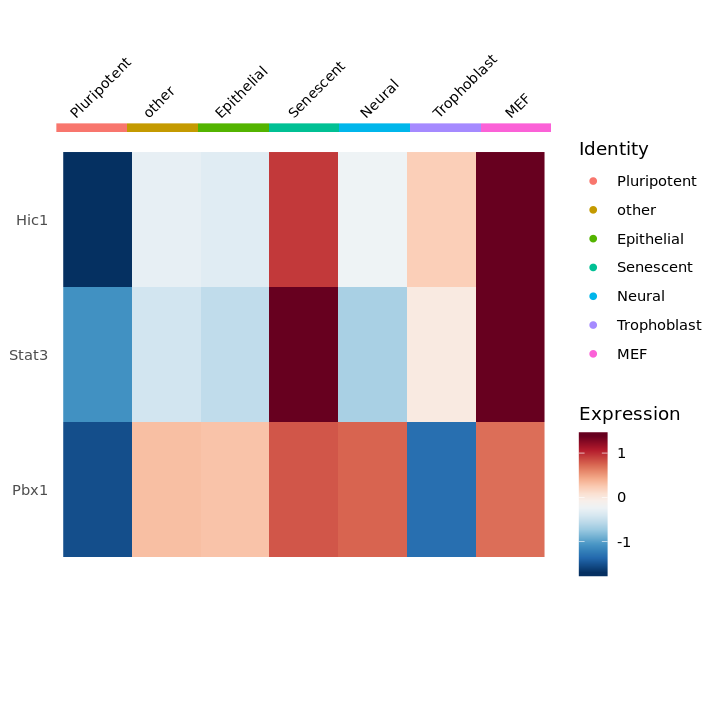

In [97]:
DoHeatmap(cluster.averages.scenic, features = c(
                                                "Hic1","Stat3","Nfix","Dab2","Prrx2","Twist2","Akr1a1","Mecom","Pbx1","Gli3"
                                                ), size = 3, 
    draw.lines = FALSE)+ scale_fill_viridis()+scale_fill_gradientn(colours = rev(mapal))

Warning message in DoHeatmap(cluster.averages.scenic, features = c("Nanog", "Zic3", :
"The following features were omitted as they were not found in the scale.data slot for the RNA assay: Zic5, Zscan10, Timm8a1, Trim28, Mycn, Otx2, Zic3"Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.


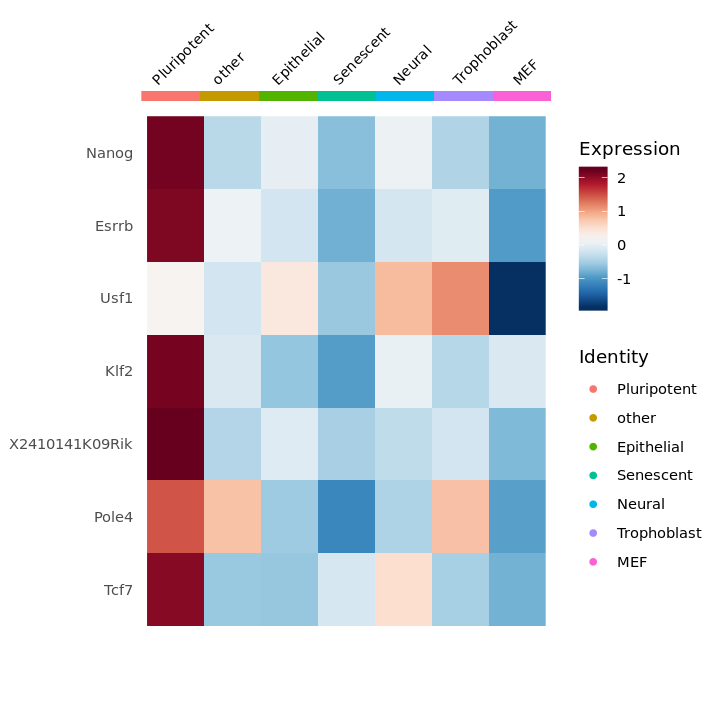

In [98]:
DoHeatmap(cluster.averages.scenic, features = c(
                                                "Nanog","Zic3","Otx2","Esrrb","Usf1","Mycn","Klf2","Trim28",
                                                "Timm8a1","X2410141K09Rik","Zscan10","Zic5","Pole4","Tcf7"
                                                ), size = 3, 
    draw.lines = FALSE) +scale_fill_gradientn(colours = rev(mapal))

In [116]:
DefaultAssay(object = seurat_scenic.int) <- "RNA"
all.genes <- rownames(seurat_scenic.int)
seurat_scenic.int <- ScaleData(seurat_scenic.int, features = all.genes)

In [120]:
seurat_scenic.int.markers <- FindAllMarkers(seurat_scenic.int, only.pos = TRUE,  logfc.threshold = 0.05)
seurat_scenic.int.markers %>% group_by(cluster) %>% top_n(n = 2, wt = avg_logFC)

Calculating cluster Pluripotent
Calculating cluster other
Calculating cluster Epithelial
Calculating cluster Senescent
Calculating cluster Neural
Calculating cluster Trophoblast
Calculating cluster MEF


p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
0,0.24887037,1.000,0.984,0,Pluripotent,Sox2
0,0.24814981,0.930,0.138,0,Pluripotent,Tbx3
0,0.07773065,0.903,0.584,0,other,Id1
0,0.13473664,0.987,0.480,0,Epithelial,Irf6
0,0.07507092,0.694,0.274,0,Epithelial,Gata3
0,0.20213743,0.996,0.680,0,Senescent,Runx1
0,0.15437758,0.915,0.354,0,Senescent,Hif1a
0,0.06396704,0.455,0.131,0,Neural,Nkx2.2
0,0.05799009,0.983,0.780,0,Neural,Msx3
0,0.20362300,0.977,0.280,0,Trophoblast,Gata3


In [121]:
options(repr.plot.width=10, repr.plot.height = 10)
top10 <- seurat_scenic.int.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
pdf("SCENIC/Schiebinger/seurat_scenic.int_marker_regs_per_identity.pdf", useDingbats = FALSE,width = 15, height=15)
DoHeatmap(seurat_scenic.int, features = top10$gene) + NoLegend()
dev.off()

png 
  2